In [57]:
import pickle
import os
import pandas as pd
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, LineString
import random 
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_similarity
from scipy.stats import ttest_ind

import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from itertools import combinations

In [37]:
lsoas_file = os.path.join("../../data/SpatialData/", "LSOAs_2011", "LSOA_2011_EW_BSC_V4.shp")

def find_optimal_k(all_embeddings):
    # --- Range of cluster counts to test ---
    n_samples = len(all_embeddings)
    max_k = min(20, n_samples - 1)
    k_values = range(2, max_k + 1)

    inertias = []
    sil_scores = []

    for k in k_values:
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(all_embeddings)

        inertias.append(kmeans.inertia_)
        sil_scores.append(silhouette_score(all_embeddings, labels))

    best_k = k_values[np.argmax(sil_scores)]
    return best_k

def plot_example_images_per_cluster(df, k, n_show=5):
    fixed_rows, fixed_cols = 2, 6  # always 6 spaces total

    for c in range(k):
        cluster_imgs = df.loc[df['scene_cluster'] == c, 'image_files']
        if len(cluster_imgs) == 0:
            continue

        # Sample up to n_show images
        sample_imgs = random.sample(list(cluster_imgs), min(n_show, len(cluster_imgs)))

        fig, axes = plt.subplots(fixed_rows, fixed_cols, figsize=(fixed_cols * 3, fixed_rows * 3))
        axes = np.array(axes).reshape(-1)  # flatten axes for easy indexing

        for ax, img_path in zip(axes, sample_imgs):
            adj_path = img_path.replace("airbnb-manchester/", "embeddings/").replace("../", "../../")
            img = plt.imread(adj_path)
            ax.imshow(img)
            ax.axis("off")

        # Hide any unused subplot spaces
        for ax in axes[len(sample_imgs):]:
            ax.axis("off")

        plt.suptitle(f"Global Cluster {c}", fontsize=14, fontweight='bold')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()
        
def lsoa_within_between_summary(expanded_gdf):
    results = []

    for lsoa, df_lsoa in expanded_gdf.groupby('LSOA11CD'):
        embeddings = np.stack(df_lsoa['embedding'].values)
        clusters = df_lsoa['scene_cluster'].values
        n_total = len(embeddings)

        if n_total < 2:
            results.append({
                'LSOA11CD': lsoa,
                'mean_within': np.nan,
                'mean_between': np.nan,
                'within_minus_between': np.nan,
                'n_images': n_total
            })
            continue

        sim_matrix = cosine_similarity(embeddings)
        within_sims = []
        between_sims = []

        for i, j in combinations(range(n_total), 2):
            sim = sim_matrix[i, j]
            if clusters[i] == clusters[j]:
                within_sims.append(sim)
            else:
                between_sims.append(sim)

        mean_within = np.mean(within_sims) if within_sims else np.nan
        mean_between = np.mean(between_sims) if between_sims else np.nan
        within_minus_between = mean_within - mean_between if mean_within is not np.nan and mean_between is not np.nan else np.nan

        results.append({
            'LSOA11CD': lsoa,
            'mean_within': mean_within,
            'mean_between': mean_between,
            'within_minus_between': within_minus_between,
            'n_images': n_total
        })

    df_results = pd.DataFrame(results)

    # Check for LSOAs where between > within
    anomalies = df_results[df_results['within_minus_between'] < 0]
    n_anomalies = len(anomalies)
    if n_anomalies > 0:
        print(f"Warning: {n_anomalies} LSOAs have higher between-cluster similarity than within-cluster similarity.")
    else:
        print("All LSOAs have higher within-cluster similarity than between-cluster similarity.")

    return df_results


### Get spatial data

In [12]:
lsoas =  gpd.read_file(lsoas_file)
manc_lads = ['Manchester', 'Rochdale', 'Bolton', 'Bury', 'Wigan', 'Oldham',  'Trafford', 'Salford', 'Tameside', 'Stockport']
manc_lads_pattern = '|'.join(manc_lads)
gm_lsoa=lsoas[lsoas['LSOA11NMW'].str.contains(manc_lads_pattern)]
gm_lsoa = gm_lsoa.to_crs(epsg=4326)

### Get embeddings (four per location)

In [13]:
points_data_cache = data_dir + "points_with_embeddings.pkl"
with open(points_data_cache, "rb") as f:
    point_records = pickle.load(f)

### Join image embeddings points to gentrification LSOAs

In [15]:
point_coords = [Point(rec['longitude'], rec['latitude']) for rec in point_records]
points_labels_gdf = gpd.GeoDataFrame(point_records, geometry=point_coords, crs="EPSG:4326")

# Perform spatial join to get gentrification label for each point
points_labels_gdf = gpd.sjoin(points_labels_gdf, gm_lsoa, how='inner', predicate='within')
# sjoin may add an index from the polygon ('index_right'); we can drop it
if 'index_right' in points_labels_gdf.columns:
    points_labels_gdf = points_labels_gdf.drop(columns=['index_right'])

print(f"Points after spatial join: {len(points_labels_gdf)} / {len(point_records)}"
      f" `(some points may lie outside the label polygons and were dropped)")

Points after spatial join: 18897 / 18897 `(some points may lie outside the label polygons and were dropped)


In [16]:
expanded_rows = []

for _, row in points_labels_gdf.iterrows():
    embeddings = row['embedding']      # list of 4 embeddings
    images = row['image_files']        # list of 4 image paths

    # Skip if lengths don't match
    if len(embeddings) != len(images):
        print(f"Skipping row {row.name}: {len(embeddings)} embeddings, {len(images)} images")
        continue

    for emb, img in zip(embeddings, images):
        new_row = row.to_dict()        # copy all other columns
        new_row['embedding'] = emb     # single embedding
        new_row['image_files'] = img    # single image
        expanded_rows.append(new_row)

# Create new DataFrame
expanded_gdf = pd.DataFrame(expanded_rows)
print(f"Original rows: {len(points_labels_gdf)}, Expanded rows: {len(expanded_gdf)}")
expanded_gdf = pd.DataFrame(expanded_rows)

Skipping row 9158: 3 embeddings, 4 images
Skipping row 18664: 3 embeddings, 4 images
Original rows: 18897, Expanded rows: 75580


# Run cluster analysis over the entire set of images
### Run a PCA to reduce embedding dimensionality

In [17]:
all_embeddings = np.stack(expanded_gdf['embedding'].values)
pca = PCA(n_components=50, random_state=42)
reduced_embeddings = pca.fit_transform(all_embeddings)
print(f"Explained variance by 20 components: {pca.explained_variance_ratio_.sum():.2f}")
# set back on dataframe
expanded_gdf['embedding_reduced'] = list(reduced_embeddings)

Explained variance by 20 components: 0.65


### Run cluster analysis on reduced embeddings

In [22]:
k = 5  # e.g., parks, houses, roads, industrial, water
kmeans = KMeans(n_clusters=k, random_state=42)
all_embeddings = np.stack(expanded_gdf['embedding_reduced'].values)
expanded_gdf['scene_cluster'] = kmeans.fit_predict(all_embeddings)

### Check images to see whether clustering is logical (to me)

In [40]:
# plot_example_images_per_cluster(expanded_gdf, k, n_show=6)

### For each LSOA, compare between and within cluster group similarity

In [71]:
lsoa_sim_df = lsoa_within_between_summary(expanded_gdf)
lsoa_sim_df.head()

,LSOA11CD,mean_within,mean_between,within_minus_between,n_images
0,E01004766,0.513102,0.349985,0.163117,64
1,E01004767,0.472873,0.323371,0.149502,72
2,E01004768,0.602358,0.378000,0.224358,56
3,E01004769,0.478979,0.280748,0.198231,36
4,E01004770,0.586373,0.331539,0.254834,40


### For each LSOA, calculate mean embedding in each cluster

In [86]:
import pandas as pd
import numpy as np

def mean_embedding_per_cluster(expanded_gdf, K, embedding_col):
    """
    Compute mean embedding per cluster for each LSOA.
    
    Parameters:
    - expanded_gdf: DataFrame with columns 'LSOA11CD', 'embedding', 'scene_cluster'
    - K: total number of clusters (0 to K-1)
    
    Returns:
    - DataFrame with one row per LSOA, columns: 'cluster_0', 'cluster_1', ..., 'cluster_{K-1}'
      Each cell contains the mean embedding vector for that cluster, or np.nan if no images in cluster.
    """
    results = []

    for lsoa, df_lsoa in expanded_gdf.groupby('LSOA11CD'):
        row = {'LSOA11CD': lsoa}
        for k in range(K):
            cluster_embeddings = df_lsoa.loc[df_lsoa['scene_cluster'] == k, embedding_col].values
            if len(cluster_embeddings) == 0:
                row[f'cluster_{k}'] = np.nan  # no images in this cluster
            else:
                row[f'cluster_{k}'] = np.mean(np.stack(cluster_embeddings), axis=0)
        results.append(row)

    return pd.DataFrame(results)

# Usage example
K = expanded_gdf['scene_cluster'].max() + 1  # number of clusters
lsoa_cluster_means_df = mean_embedding_per_cluster(expanded_gdf, K, 'embedding_reduced')

In [93]:
len(lsoa_cluster_means_df['cluster_1'][0])
lsoa_cluster_means_df.to_csv(data_dir+ "global_clusters_mean_emeddings.csv", index= False)
data = pd.read_csv(data_dir+ "global_clusters_mean_emeddings.csv")
data.head()
len(data['cluster_1'][0])

50

In [90]:
# Keep only LSOAs where no cluster embedding is missing
cluster_cols = [f'cluster_{k}' for k in range(K)]
complete_lsoas_df = lsoa_cluster_means_df.dropna(subset=cluster_cols)

print(f"Kept {len(complete_lsoas_df)} LSOAs out of {len(lsoa_cluster_means_df)} that have all clusters present")

Kept 1308 LSOAs out of 1669 that have all clusters present


In [94]:
# lsoa_cluster_means_df.to_csv(data_dir+ "global_clusters_mean_emeddings.csv", index= False)
# Save
lsoa_cluster_means_df.to_pickle(data_dir + "global_clusters_mean_embeddings.pkl")

### Find the cosine similarity of the 4 images at each location

In [5]:
# from sklearn.metrics.pairwise import cosine_similarity

# # Example: suppose each row has a list of 4 embeddings in 'embedding' column
# # embeddings should be NumPy arrays of same length

# def mean_cosine_similarity(embeddings_list):
#     """
#     embeddings_list: list of 4 embeddings (arrays)
#     returns mean pairwise cosine similarity
#     """
#     # Stack embeddings into a 2D array (4, embedding_dim)
#     emb_array = np.stack(embeddings_list)
    
#     # Compute cosine similarity matrix
#     sim_matrix = cosine_similarity(emb_array)
    
#     # Take upper triangle without diagonal
#     n = sim_matrix.shape[0]
#     upper_tri_indices = np.triu_indices(n, k=1)
#     mean_sim = sim_matrix[upper_tri_indices].mean()
#     return mean_sim

# # Apply to dataframe
# points_labels_gdf['embedding_cosine_similarity'] = points_labels_gdf['embedding'].apply(mean_cosine_similarity)


In [137]:
expanded_rows = []

for _, row in points_labels_gdf.iterrows():
    embeddings = row['embedding']
    # embeddings = embeddings_list[0]  # unwrap the inner list
    images = row['image_files']

    # Skip this row if lengths don't match
    if len(embeddings_list) != len(images):
        print(f"Skipping row {row.name}: {len(embeddings)} embeddings, {len(images)} images")
        continue

    for idx, (emb, img_path) in enumerate(zip(embeddings, images)):
        new_row = row.to_dict()
        new_row['embedding'] = emb
        new_row['image_file'] = img_path
        new_row['merged_index'] = idx
        expanded_rows.append(new_row)

expanded_gdf = pd.DataFrame(expanded_rows)
print(f"Total embeddings for clustering: {len(expanded_gdf)}")


Total embeddings for clustering: 75586


In [143]:
from sklearn.decomposition import PCA

all_embeddings = np.stack(expanded_gdf['embedding'].values)
pca = PCA(n_components=20, random_state=42)
reduced_embeddings = pca.fit_transform(all_embeddings)
print(f"Explained variance by 20 components: {pca.explained_variance_ratio_.sum():.2f}")

expanded_gdf['embedding_reduced'] = list(reduced_embeddings)

from sklearn.cluster import KMeans

k = 5  # e.g., parks, houses, roads, industrial, water
kmeans = KMeans(n_clusters=k, random_state=42)
expanded_gdf['scene_cluster'] = kmeans.fit_predict(reduced_embeddings)


In [147]:
len(expanded_gdf['embedding'][0])

768

In [81]:
composition = (
    expanded_gdf.groupby('LSOA11CD')['scene_cluster']
    .value_counts(normalize=True)
    .unstack(fill_value=0))

# Optional: rename columns
composition.columns = [f"cluster_{c}_prop" for c in composition.columns]
composition.reset_index(inplace=True)
composition.head()

,LSOA11CD,cluster_0_prop,cluster_1_prop,cluster_2_prop,cluster_3_prop,cluster_4_prop
0,E01004766,0.296875,0.187500,0.125000,0.187500,0.203125
1,E01004767,0.236111,0.138889,0.194444,0.208333,0.222222
2,E01004768,0.285714,0.375000,0.303571,0.017857,0.017857
3,E01004769,0.250000,0.111111,0.388889,0.055556,0.194444
4,E01004770,0.250000,0.325000,0.275000,0.050000,0.100000


In [89]:
df =expanded_gdf
n_show=5
c = 1
cluster_imgs = df.loc[df['scene_cluster'] == c, 'image_files']
sample_imgs = random.sample(list(cluster_imgs), min(n_show, len(cluster_imgs)))
for ax, img_path in zip(axes, sample_imgs):
    print(img_path)

['../data/airbnb-manchester/street_images/point4953_heading0.jpg', '../data/airbnb-manchester/street_images/point4953_heading90.jpg', '../data/airbnb-manchester/street_images/point4953_heading180.jpg', '../data/airbnb-manchester/street_images/point4953_heading270.jpg']


AttributeError: 'list' object has no attribute 'replace'

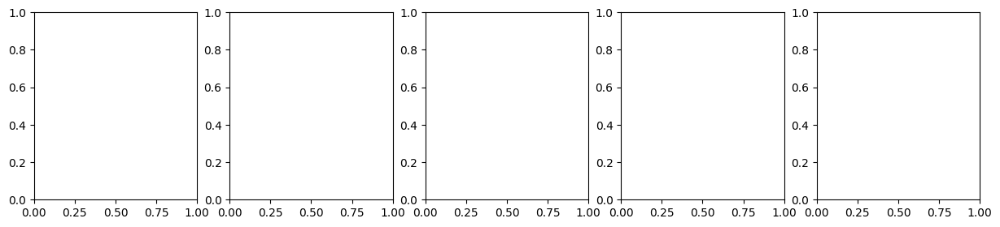

In [82]:
def plot_example_images_per_cluster(df, n_show=5):
    for c in range(k):
        cluster_imgs = df.loc[df['scene_cluster'] == c, 'image_files']
        if len(cluster_imgs) == 0:
            continue
        sample_imgs = random.sample(list(cluster_imgs), min(n_show, len(cluster_imgs)))
        fig, axes = plt.subplots(1, len(sample_imgs), figsize=(len(sample_imgs)*3, 3))
        if len(sample_imgs) == 1:
            axes = [axes]
        for ax, img_path in zip(axes, sample_imgs):
            adj_path = img_path.replace("airbnb-manchester/", "embeddings/").replace("../", "../../")
            img = plt.imread(adj_path)
            ax.imshow(img)
            ax.axis("off")
        plt.suptitle(f"Global Cluster {c}", fontsize=14, fontweight='bold')
        plt.show()

plot_example_images_per_cluster(expanded_gdf, n_show=5)

## For each LSOA check the optimal number of clusters with silhoutte scores

In [66]:
lsoas_with_enough = []
for lsoa_code in np.unique(points_labels_gdf['LSOA11CD']):
    one_lsoa = points_labels_gdf[points_labels_gdf['LSOA11CD'] ==lsoa_code]
    if len(one_lsoa)>20:
        lsoas_with_enough.append(lsoa_code)
len(lsoas_with_enough)

97

In [70]:
for lsoa_code in lsoas_with_enough:
    one_lsoa = points_labels_gdf[points_labels_gdf['LSOA11CD'] ==lsoa_code]

    # --- Gather all embeddings from one LSOA ---
    all_embeddings = []
    for _, row in one_lsoa.iterrows():
        all_embeddings.extend(row['embedding'])
    all_embeddings = np.stack(all_embeddings)

    pca = PCA(n_components=3, random_state=42)
    all_embeddings = pca.fit_transform(all_embeddings)
    
    # --- Range of cluster counts to test ---
    n_samples = len(all_embeddings)
    max_k = min(20, n_samples - 1)
    k_values = range(2, max_k + 1)

    inertias = []
    sil_scores = []

    for k in k_values:
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(all_embeddings)

        inertias.append(kmeans.inertia_)
        sil_scores.append(silhouette_score(all_embeddings, labels))
        
        
    sil_adj = [s - 0.01 * k for s, k in zip(sil_scores, k_values)]
    adjusted_best_k = k_values[np.argmax(sil_adj)]
        
    best_k = k_values[np.argmax(sil_scores)]
    print(f"{lsoa_code}: {best_k} and adjusted best-k {adjusted_best_k}")

E01004775: 3 and adjusted best-k 3
E01004776: 5 and adjusted best-k 5
E01004780: 4 and adjusted best-k 4
E01004781: 4 and adjusted best-k 4
E01004817: 5 and adjusted best-k 2
E01004833: 3 and adjusted best-k 3
E01004848: 4 and adjusted best-k 4
E01004884: 4 and adjusted best-k 4
E01004901: 3 and adjusted best-k 3
E01004956: 4 and adjusted best-k 4
E01004969: 4 and adjusted best-k 4
E01005000: 3 and adjusted best-k 3
E01005014: 4 and adjusted best-k 4
E01005024: 4 and adjusted best-k 4
E01005027: 4 and adjusted best-k 3
E01005047: 3 and adjusted best-k 3
E01005049: 4 and adjusted best-k 4
E01005054: 7 and adjusted best-k 2
E01005061: 4 and adjusted best-k 4
E01005065: 10 and adjusted best-k 5
E01005100: 4 and adjusted best-k 4
E01005105: 4 and adjusted best-k 4
E01005106: 4 and adjusted best-k 4
E01005140: 5 and adjusted best-k 4
E01005147: 3 and adjusted best-k 3
E01005160: 7 and adjusted best-k 2
E01005232: 4 and adjusted best-k 4
E01005242: 2 and adjusted best-k 2
E01005245: 7 and ad

In [ ]:
# --- Step 2: Reduce dimensionality with PCA ---
pca = PCA(n_components=20, random_state=42)
embeddings_reduced = pca.fit_transform(all_embeddings)
print(f"Explained variance by 20 components: {pca.explained_variance_ratio_.sum():.2f}")

In [20]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import random

def merge_similar_embeddings(embeddings, threshold=0.9):
    embeddings = np.array(embeddings)
    if len(embeddings) <= 1:
        return embeddings
    
    # Compute pairwise cosine similarities
    sims = cosine_similarity(embeddings)
    # We only care about off-diagonal similarities
    upper_tri = sims[np.triu_indices(len(sims), k=1)]
    
    # If all pairs are highly similar, merge them
    if np.all(upper_tri > threshold):
        mean_vec = np.mean(embeddings, axis=0)
        return [mean_vec]
    else:
        return list(embeddings)

# Apply to your dataframe
one_lsoa = points_labels_gdf[:10].copy()
one_lsoa['merged_embeddings'] = one_lsoa['embedding'].apply(merge_similar_embeddings)

In [47]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import networkx as nx
from sklearn.decomposition import PCA
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import random
import matplotlib.patches as patches

# --- Merge function for pairs/triples ---
def merge_similar_subgroups(embeddings, threshold=0.7):
    embeddings = np.array(embeddings)
    
    pca = PCA(n_components=3, random_state=42)
    embeddings = pca.fit_transform(embeddings)
    
    n = len(embeddings)
    if n <= 1:
        return embeddings, None, False, [[0]]  # single group
    
    sims = cosine_similarity(embeddings)
    
    # Graph: nodes = embeddings, edges = pairs above threshold
    G = nx.Graph()
    G.add_nodes_from(range(n))
    for i in range(n):
        for j in range(i+1, n):
            if sims[i,j] > threshold:
                G.add_edge(i,j)
    
    # Connected components → groups to merge
    merged_embeddings = []
    groups = []
    for component in nx.connected_components(G):
        idxs = list(component)
        group = embeddings[idxs]
        merged_embeddings.append(np.mean(group, axis=0))
        groups.append(idxs)
    
    merged_flag = len(merged_embeddings) < n
    return merged_embeddings, sims, merged_flag, groups


one_lsoa = points_labels_gdf[:500].copy()
results = one_lsoa['embedding'].apply(merge_similar_subgroups)

one_lsoa['merged_embeddings'] = results.apply(lambda x: x[0])
one_lsoa['similarity_matrix'] = results.apply(lambda x: x[1])
one_lsoa['merged_flag'] = results.apply(lambda x: x[2])
one_lsoa['merged_groups'] = results.apply(lambda x: x[3])  # list of lists of indices


import matplotlib.cm as cm

def show_row_with_merged_groups(row):
    n_imgs = len(row['image_files'])
    groups = row['merged_groups']  # list of lists of indices
    # Assign a color to each group
    colors = cm.get_cmap('tab10', len(groups)).colors

    fig, axes = plt.subplots(1, n_imgs, figsize=(n_imgs * 3, 3))
    if n_imgs == 1:
        axes = [axes]

    # Map embedding index → group color
    idx_to_color = {}
    for color, group in zip(colors, groups):
        for idx in group:
            idx_to_color[idx] = color

    for ax, idx, path in zip(axes, range(n_imgs), row['image_files']):
        adj_path = path.replace("airbnb-manchester/", "embeddings/").replace("../", "../../")
        img = plt.imread(adj_path)
        ax.imshow(img)
        ax.axis("off")
        # Add colored border if in a merged group
        rect = patches.Rectangle((0,0), img.shape[1], img.shape[0],
                                 linewidth=5, edgecolor=idx_to_color[idx], facecolor='none')
        ax.add_patch(rect)

    status = "MERGED ✅" if row['merged_flag'] else "KEPT SEPARATE ❌"
    plt.suptitle(f"{status} | LSOA: {row['LSOA11CD']}", fontsize=14, fontweight='bold')
    plt.show()

    # Cosine similarity heatmap
#     if row['similarity_matrix'] is not None:
#         plt.figure(figsize=(3,3))
#         sns.heatmap(row['similarity_matrix'], annot=True, fmt=".2f", cmap="Blues", vmin=0, vmax=1)
#         plt.title("Cosine Similarities Between Embeddings")
#         plt.show()
        
# Randomly pick a few merged and not-merged rows
for label, subset in [("Merged", True), ("Not merged", False)]:
    print(f"\n=== {label.upper()} EXAMPLES ===")
    sample_subset = one_lsoa[one_lsoa['merged_flag'] == subset].sample(2, random_state=42)
    for _, row in sample_subset.iterrows():
        show_row_with_merged_groups(row)



=== MERGED EXAMPLES ===


ValueError: Cannot take a larger sample than population when 'replace=False'

8


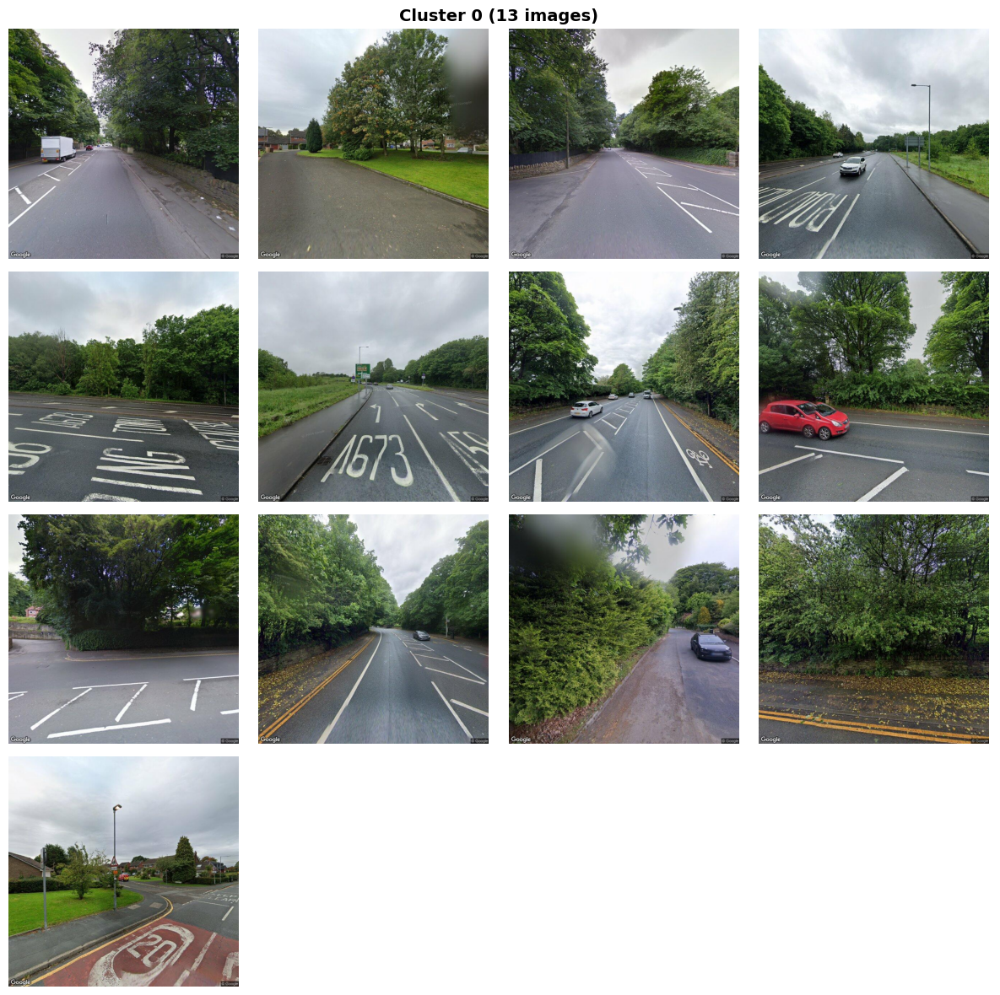

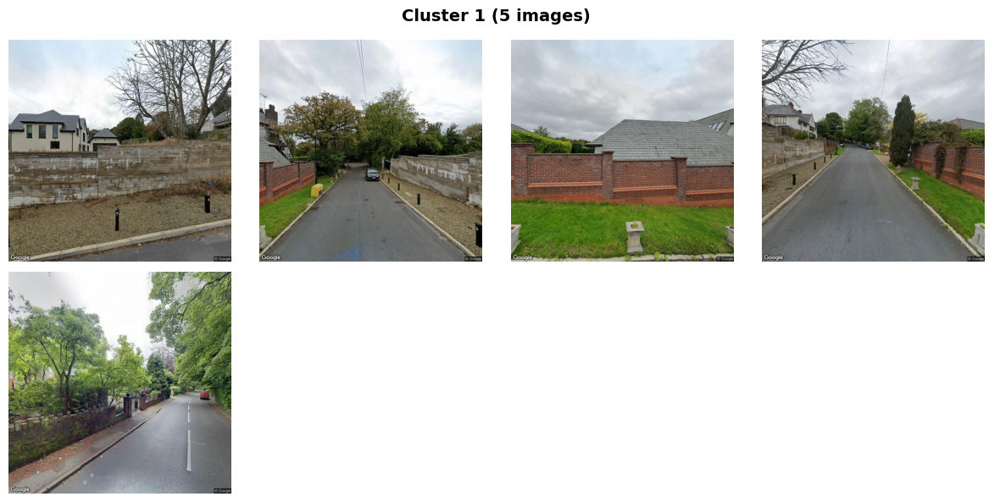

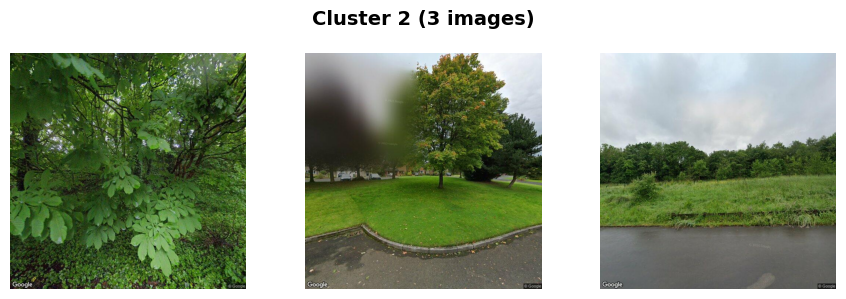

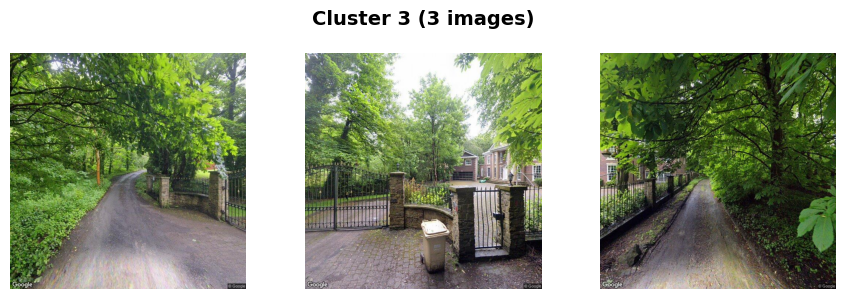

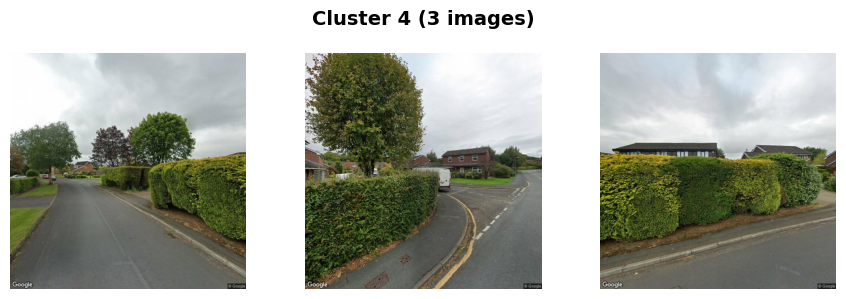

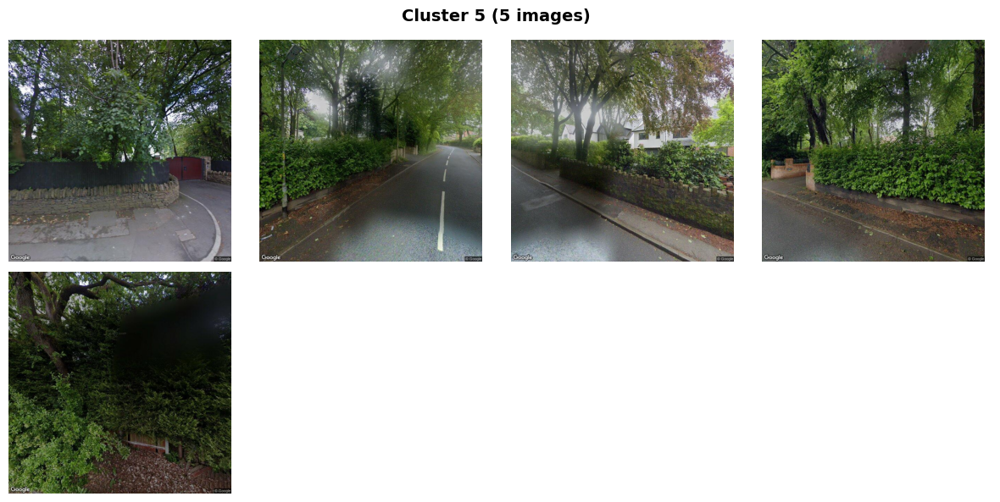

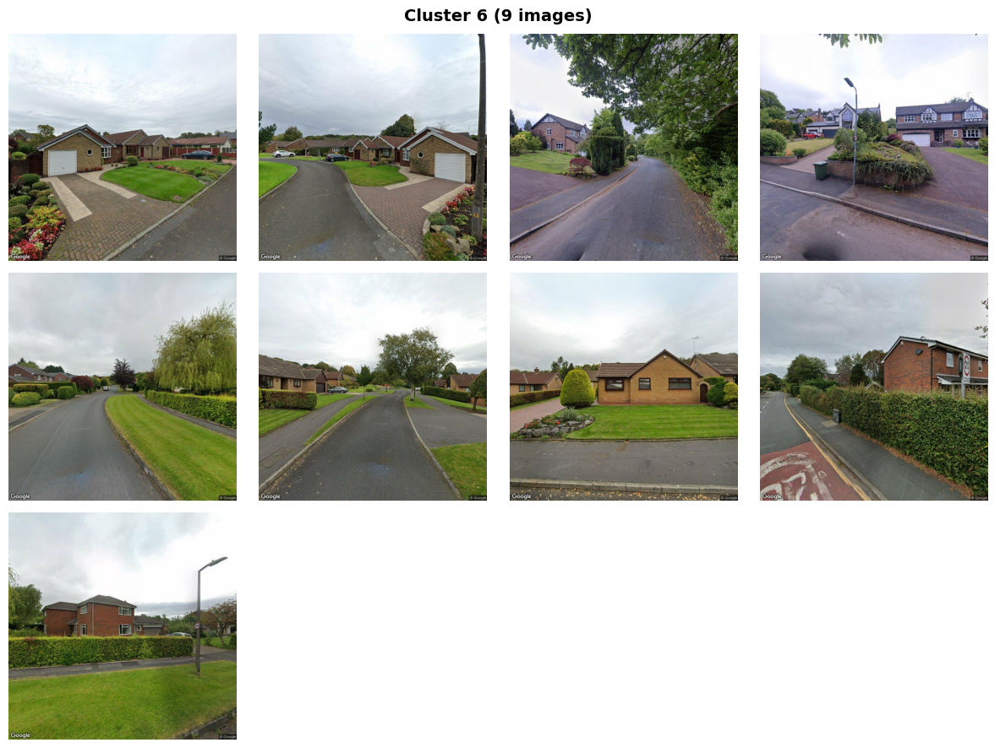

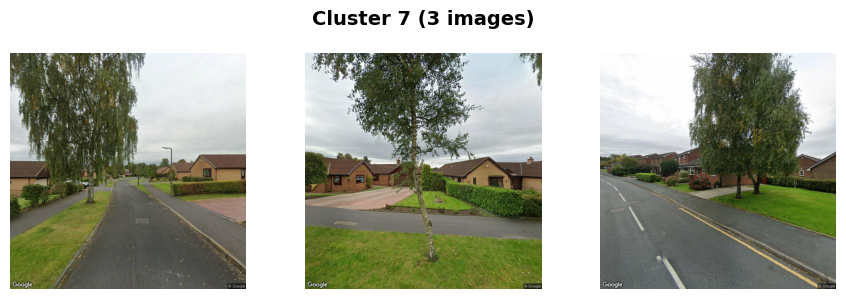

In [58]:
one_lsoa = points_labels_gdf[points_labels_gdf['LSOA11CD'] =="E01004844"]

# --- STEP 1: Collect all embeddings + image paths from one LSOA ---
all_embeddings = []
all_image_paths = []

for _, row in one_lsoa.iterrows():
    for emb, img_path in zip(row['embedding'], row['image_files']):
        all_embeddings.append(emb)
        all_image_paths.append(img_path)

all_embeddings = np.stack(all_embeddings)

pca = PCA(n_components=7, random_state=42)
all_embeddings = pca.fit_transform(all_embeddings)

# --- STEP 2: Cluster embeddings ---
n_clusters =find_optimal_k(all_embeddings)
print(n_clusters)
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(all_embeddings)

cluster_df = pd.DataFrame({
    'image_path': all_image_paths,
    'cluster': cluster_labels
}).sort_values('cluster').reset_index(drop=True)

# --- STEP 3: Plot images by cluster ---
for c in range(n_clusters):
    cluster_imgs = cluster_df[cluster_df['cluster'] == c]['image_path'].tolist()
    n_imgs = len(cluster_imgs)
    
    if n_imgs == 0:
        continue
    
    n_cols = min(4, n_imgs)  # number of columns in grid
    n_rows = int(np.ceil(n_imgs / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3))
    axes = np.atleast_2d(axes)
    
    fig.suptitle(f"Cluster {c} ({n_imgs} images)", fontsize=14, fontweight='bold')
    
    for i, img_path in enumerate(cluster_imgs):
        r, col = divmod(i, n_cols)
        ax = axes[r, col]
        adj_path = img_path.replace("airbnb-manchester/", "embeddings/").replace("../", "../../")
        if os.path.exists(adj_path):
            img = Image.open(adj_path)
            ax.imshow(img)
        ax.axis("off")
    
    # Hide empty subplots if any
    for j in range(i + 1, n_rows * n_cols):
        r, col = divmod(j, n_cols)
        axes[r, col].axis("off")
    
    plt.tight_layout()
    plt.show()


19


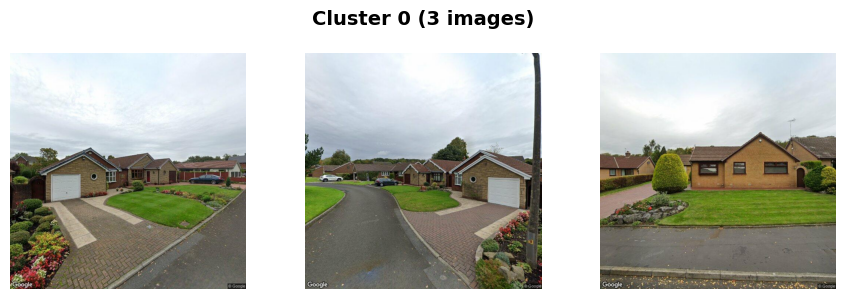

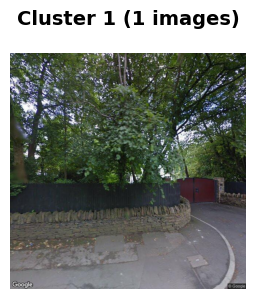

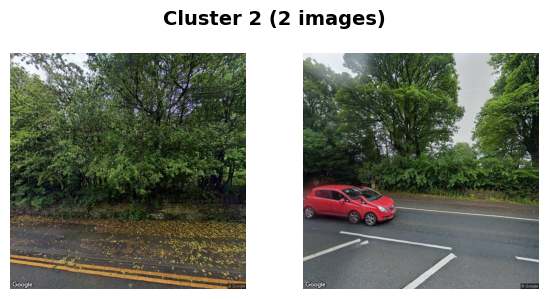

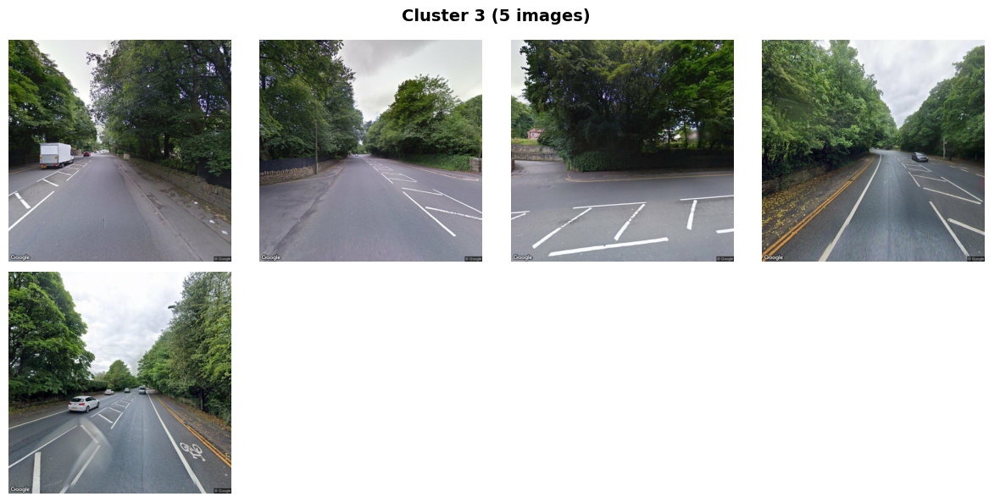

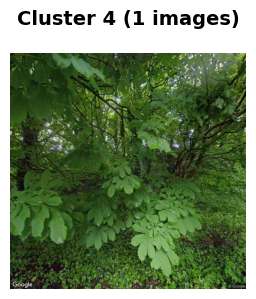

...

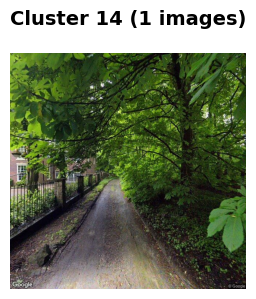

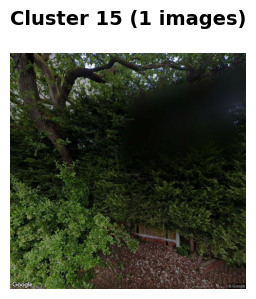

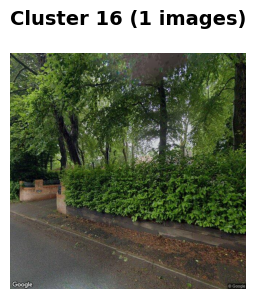

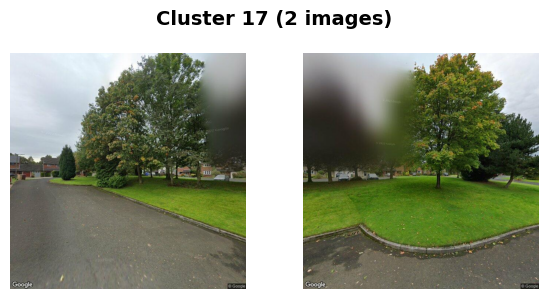

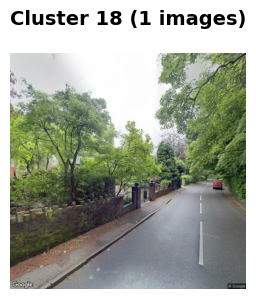

In [53]:
one_lsoa = points_labels_gdf[points_labels_gdf['LSOA11CD'] =="E01004844"]

# --- STEP 1: Collect all embeddings + image paths from one LSOA ---
all_embeddings = []
all_image_paths = []

for _, row in one_lsoa.iterrows():
    for emb, img_path in zip(row['embedding'], row['image_files']):
        all_embeddings.append(emb)
        all_image_paths.append(img_path)

all_embeddings = np.stack(all_embeddings)

pca = PCA(n_components=20, random_state=42)
# all_embeddings = pca.fit_transform(all_embeddings)

# --- STEP 2: Cluster embeddings ---
n_clusters =find_optimal_k(all_embeddings)
print(n_clusters)
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(all_embeddings)

cluster_df = pd.DataFrame({
    'image_path': all_image_paths,
    'cluster': cluster_labels
}).sort_values('cluster').reset_index(drop=True)

# --- STEP 3: Plot images by cluster ---
for c in range(n_clusters):
    cluster_imgs = cluster_df[cluster_df['cluster'] == c]['image_path'].tolist()
    n_imgs = len(cluster_imgs)
    
    if n_imgs == 0:
        continue
    
    n_cols = min(4, n_imgs)  # number of columns in grid
    n_rows = int(np.ceil(n_imgs / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3))
    axes = np.atleast_2d(axes)
    
    fig.suptitle(f"Cluster {c} ({n_imgs} images)", fontsize=14, fontweight='bold')
    
    for i, img_path in enumerate(cluster_imgs):
        r, col = divmod(i, n_cols)
        ax = axes[r, col]
        adj_path = img_path.replace("airbnb-manchester/", "embeddings/").replace("../", "../../")
        if os.path.exists(adj_path):
            img = Image.open(adj_path)
            ax.imshow(img)
        ax.axis("off")
    
    # Hide empty subplots if any
    for j in range(i + 1, n_rows * n_cols):
        r, col = divmod(j, n_cols)
        axes[r, col].axis("off")
    
    plt.tight_layout()
    plt.show()


In [32]:
# # Group by LSOA and compute diversity
# lsoa_diversity = points_labels_gdf.groupby('LSOA11CD')['embedding'].apply(
#     lambda x: embedding_diversity(list(x))).reset_index(name='diversity')